In [3]:
from zipfile import ZipFile
import os

zip_file_path = '/content/women-fashion.zip'
extraction_directory = '/content/women_fashion.zip'

if not os.path.exists(extraction_directory):
    os.makedirs(extraction_directory)

with ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_directory)

extracted_files = os.listdir(extraction_directory)
print(extracted_files[:10])

['__MACOSX', 'women fashion']


In [4]:
extraction_directory_updated = os.path.join(extraction_directory, 'women fashion')


extracted_files_updated = os.listdir(extraction_directory_updated)
extracted_files_updated[:10], len(extracted_files_updated)

(['black top with spaghetti straps and a black skirt adorned with a fringe detail at the hem.jpg',
  'black dress with sparkling details.jpg',
  'off-the-shoulder black ball gown.jpg',
  'ladies-party-wear-cotton-short-dress-full.jpg',
  'floral dress with long sleeves.jpeg',
  'shiny purple sequined dress with a one-shoulder design.jpg',
  'long, flowing, pink dress with a sparkly texture.jpg',
  'sparkling, fitted dress with long sleeves.jpg',
  'sparkling blue dress.jpeg',
  'dark, elegant, sleeveless dress that reaches down to about mid-calf.jpg'],
 97)

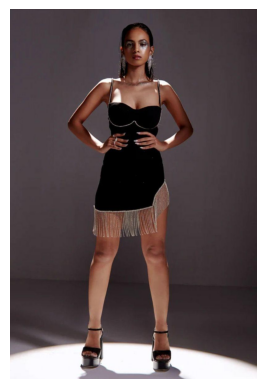

In [5]:
from PIL import Image
import matplotlib.pyplot as plt


def display_image(file_path):
    image = Image.open(file_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()


first_image_path = os.path.join(extraction_directory_updated, extracted_files_updated[0])
display_image(first_image_path)

In [6]:
import glob


image_directory = '/content/women_fashion/women fashion'

image_paths_list = [file for file in glob.glob(os.path.join(image_directory, '*.*')) if file.endswith(('.jpg', '.png', '.jpeg', 'webp'))]


print(image_paths_list)

[]


In [15]:

!pip install tensorflow pillow


from google.colab import files
uploaded = files.upload()


import zipfile
import os

zip_file_name = list(uploaded.keys())[0]  # Get uploaded file name
output_dir = "/content/images"
with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall(output_dir)
print("Extracted files to", output_dir)


from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
import numpy as np


base_model = VGG16(weights='imagenet', include_top=False)
model = Model(inputs=base_model.input, outputs=base_model.output)


def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array_expanded = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array_expanded)


def extract_features(model, preprocessed_img):
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / np.linalg.norm(flattened_features)
    return normalized_features


import glob

image_paths_list = glob.glob(os.path.join(output_dir, '**', '*.*'), recursive=True)
image_paths_list = [img for img in image_paths_list if img.endswith(('.jpg', '.jpeg', '.png'))]

all_features = []
all_image_names = []

for img_path in image_paths_list:
    try:
        preprocessed_img = preprocess_image(img_path)
        features = extract_features(model, preprocessed_img)
        all_features.append(features)
        all_image_names.append(img_path)
    except Exception as e:
        print(f"Error processing {img_path}: {e}")

print("Features extracted for", len(all_image_names), "images.")


import pickle

with open("features.pkl", "wb") as f:
    pickle.dump(all_features, f)
with open("image_names.pkl", "wb") as f:
    pickle.dump(all_image_names, f)

print("Feature extraction complete. Files saved as 'features.pkl' and 'image_names.pkl'.")


Saving women-fashion.zip to women-fashion (1).zip
Extracted files to /content/images
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━

Saving women-fashion.zip to women-fashion (1).zip
Dataset extracted to: /content/images
Found 96 files.
Example files: ['/content/images/women fashion/black top with spaghetti straps and a black skirt adorned with a fringe detail at the hem.jpg', '/content/images/women fashion/black dress with sparkling details.jpg', '/content/images/women fashion/off-the-shoulder black ball gown.jpg', '/content/images/women fashion/ladies-party-wear-cotton-short-dress-full.jpg', '/content/images/women fashion/floral dress with long sleeves.jpeg']


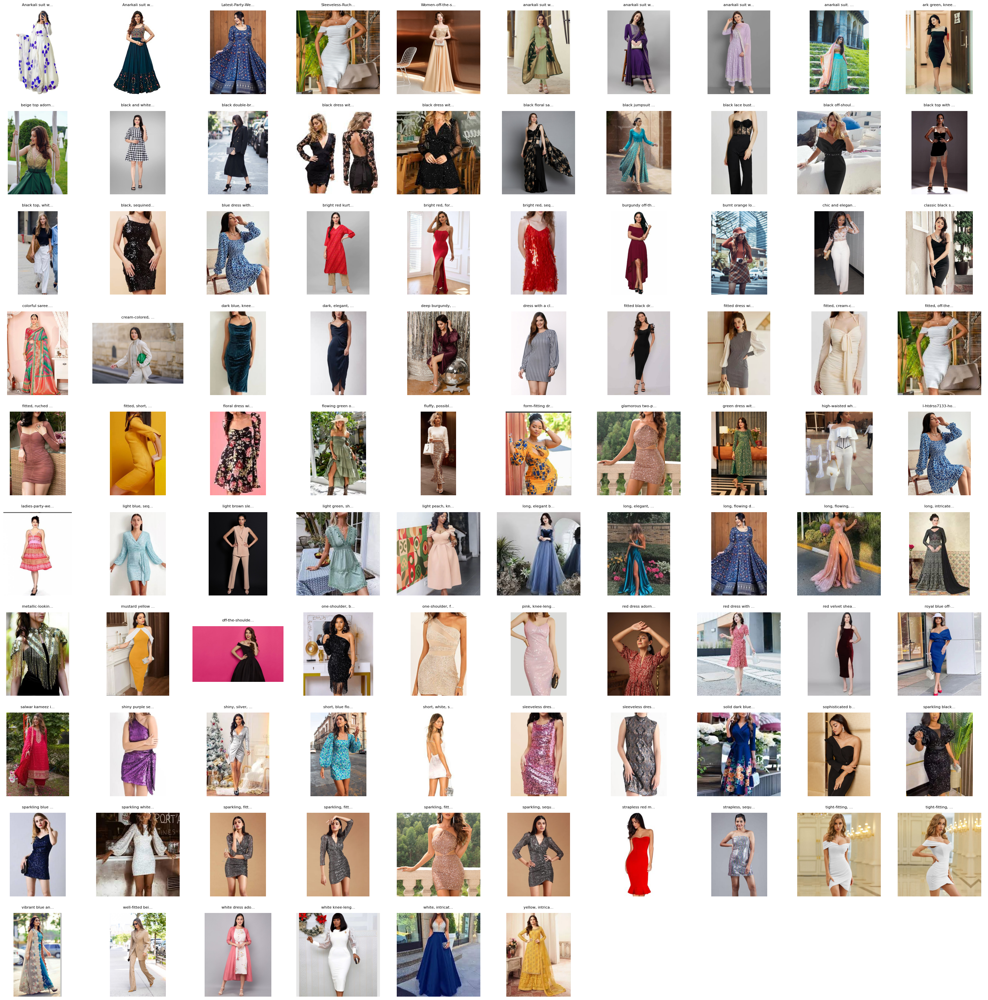

In [28]:

!pip install tensorflow pillow matplotlib


from google.colab import files
uploaded = files.upload()


import zipfile
import os

zip_file_name = list(uploaded.keys())[0]
output_dir = "/content/images"
with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall(output_dir)
print("Dataset extracted to:", output_dir)


import glob

image_files = glob.glob(f"{output_dir}/**/*.*", recursive=True)
print(f"Found {len(image_files)} files.")
print("Example files:", image_files[:5])


import matplotlib.pyplot as plt
from PIL import Image


def truncate_title(title, max_length=15):
    if len(title) > max_length:
        return title[:max_length] + "..."
    return title


num_images = min(100, len(image_files))
selected_images = sorted(image_files)[:num_images]


cols = 10
rows = (num_images + cols - 1) // cols


fig_width = cols * 3
fig_height = rows * 3
fig, axes = plt.subplots(rows, cols, figsize=(fig_width, fig_height))


for ax, img_path in zip(axes.flatten(), selected_images):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')


    title = os.path.basename(img_path)
    truncated_title = truncate_title(title)
    ax.set_title(truncated_title, fontsize=8, pad=10, loc='center')


for ax in axes.flatten()[len(selected_images):]:
    ax.axis('off')

plt.tight_layout(pad=2)
plt.show()
